In [2]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

from statsmodels.stats.outliers_influence import variance_inflation_factor

from scipy.stats import spearmanr
from scipy.cluster import hierarchy

from typing import List



C:\Users\Mate\AppData\Roaming\Python\Python39\site-packages\statsmodels\compat\pandas.py:61: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import Int64Index as NumericIndex


In [3]:
santanderdf = pd.read_pickle('../data/processed/train.pkl')
santanderdf

#Variables cuantitaivas continuas

,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
ID_code,,,,,,,,,,,,,,,,,,,,,
train_0,0,8.9255,-6.7863,11.9081,5.0930,11.4607,-9.2834,5.1187,18.6266,-4.9200,...,4.4354,3.9642,3.1364,1.6910,18.5227,-2.3978,7.8784,8.5635,12.7803,-1.0914
train_1,0,11.5006,-4.1473,13.8588,5.3890,12.3622,7.0433,5.6208,16.5338,3.1468,...,7.6421,7.7214,2.5837,10.9516,15.4305,2.0339,8.1267,8.7889,18.3560,1.9518
train_2,0,8.6093,-2.7457,12.0805,7.8928,10.5825,-9.0837,6.9427,14.6155,-4.9193,...,2.9057,9.7905,1.6704,1.6858,21.6042,3.1417,-6.5213,8.2675,14.7222,0.3965
train_3,0,11.0604,-2.1518,8.9522,7.1957,12.5846,-1.8361,5.8428,14.9250,-5.8609,...,4.4666,4.7433,0.7178,1.4214,23.0347,-1.2706,-2.9275,10.2922,17.9697,-8.9996
train_4,0,9.8369,-1.4834,12.8746,6.6375,12.2772,2.4486,5.9405,19.2514,6.2654,...,-1.4905,9.5214,-0.1508,9.1942,13.2876,-1.5121,3.9267,9.5031,17.9974,-8.8104
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
train_199995,0,11.4880,-0.4956,8.2622,3.5142,10.3404,11.6081,5.6709,15.1516,-0.6209,...,6.1415,13.2305,3.9901,0.9388,18.0249,-1.7939,2.1661,8.5326,16.6660,-17.8661
train_199996,0,4.9149,-2.4484,16.7052,6.6345,8.3096,-10.5628,5.8802,21.5940,-3.6797,...,4.9611,4.6549,0.6998,1.8341,22.2717,1.7337,-2.1651,6.7419,15.9054,0.3388
train_199997,0,11.2232,-5.0518,10.5127,5.6456,9.3410,-5.4086,4.5555,21.5571,0.1202,...,4.0651,5.4414,3.1032,4.8793,23.5311,-1.5736,1.2832,8.7155,13.8329,4.1995


In [4]:
df = santanderdf.drop(columns=["target"])
df.head()

,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
ID_code,,,,,,,,,,,,,,,,,,,,,
train_0,8.9255,-6.7863,11.9081,5.0930,11.4607,-9.2834,5.1187,18.6266,-4.9200,5.7470,...,4.4354,3.9642,3.1364,1.6910,18.5227,-2.3978,7.8784,8.5635,12.7803,-1.0914
train_1,11.5006,-4.1473,13.8588,5.3890,12.3622,7.0433,5.6208,16.5338,3.1468,8.0851,...,7.6421,7.7214,2.5837,10.9516,15.4305,2.0339,8.1267,8.7889,18.3560,1.9518
train_2,8.6093,-2.7457,12.0805,7.8928,10.5825,-9.0837,6.9427,14.6155,-4.9193,5.9525,...,2.9057,9.7905,1.6704,1.6858,21.6042,3.1417,-6.5213,8.2675,14.7222,0.3965
train_3,11.0604,-2.1518,8.9522,7.1957,12.5846,-1.8361,5.8428,14.9250,-5.8609,8.2450,...,4.4666,4.7433,0.7178,1.4214,23.0347,-1.2706,-2.9275,10.2922,17.9697,-8.9996
train_4,9.8369,-1.4834,12.8746,6.6375,12.2772,2.4486,5.9405,19.2514,6.2654,7.6784,...,-1.4905,9.5214,-0.1508,9.1942,13.2876,-1.5121,3.9267,9.5031,17.9974,-8.8104


In [4]:
santanderdf.info()

#Todas las variables son float menos 'target' que es int

<class 'pandas.core.frame.DataFrame'>
Index: 200000 entries, train_0 to train_199999
Columns: 201 entries, target to var_199
dtypes: float64(200), int64(1)
memory usage: 308.2+ MB


In [5]:
santanderdf.isna().any().value_counts()

#No hay NaNs

False    201
dtype: int64

In [6]:
santanderdf.describe()

,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
count,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,...,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000
mean,0.100490,10.679914,-1.627622,10.715192,6.796529,11.078333,-5.065317,5.408949,16.545850,0.284162,...,3.234440,7.438408,1.927839,3.331774,17.993784,-0.142088,2.303335,8.908158,15.870720,-3.326537
std,0.300653,3.040051,4.050044,2.640894,2.043319,1.623150,7.863267,0.866607,3.418076,3.332634,...,4.559922,3.023272,1.478423,3.992030,3.135162,1.429372,5.454369,0.921625,3.010945,10.438015
min,0.000000,0.408400,-15.043400,2.117100,-0.040200,5.074800,-32.562600,2.347300,5.349700,-10.505500,...,-14.093300,-2.691700,-3.814500,-11.783400,8.694400,-5.261000,-14.209600,5.960600,6.299300,-38.852800
25%,0.000000,8.453850,-4.740025,8.722475,5.254075,9.883175,-11.200350,4.767700,13.943800,-2.317800,...,-0.058825,5.157400,0.889775,0.584600,15.629800,-1.170700,-1.946925,8.252800,13.829700,-11.208475
50%,0.000000,10.524750,-1.608050,10.580000,6.825000,11.108250,-4.833150,5.385100,16.456800,0.393700,...,3.203600,7.347750,1.901300,3.396350,17.957950,-0.172700,2.408900,8.888200,15.934050,-2.819550
75%,0.000000,12.758200,1.358625,12.516700,8.324100,12.261125,0.924800,6.003000,19.102900,2.937900,...,6.406200,9.512525,2.949500,6.205800,20.396525,0.829600,6.556725,9.593300,18.064725,4.836800
max,1.000000,20.315000,10.376800,19.353000,13.188300,16.671400,17.251600,8.447700,27.691800,10.151300,...,18.440900,16.716500,8.402400,18.281800,27.928800,4.272900,18.321500,12.000400,26.079100,28.500700


In [20]:
#analisis univariado

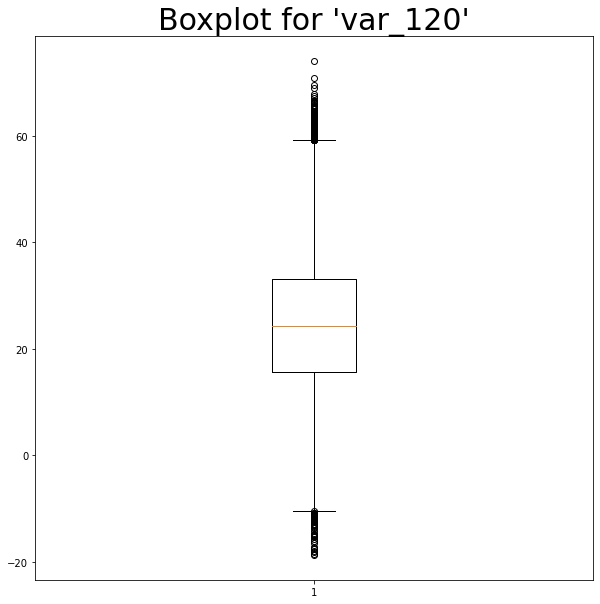

In [7]:
plt.figure(figsize=(10,10))
plt.boxplot(santanderdf["var_120"])
plt.title("Boxplot for 'var_120'", fontsize=30)

plt.show()

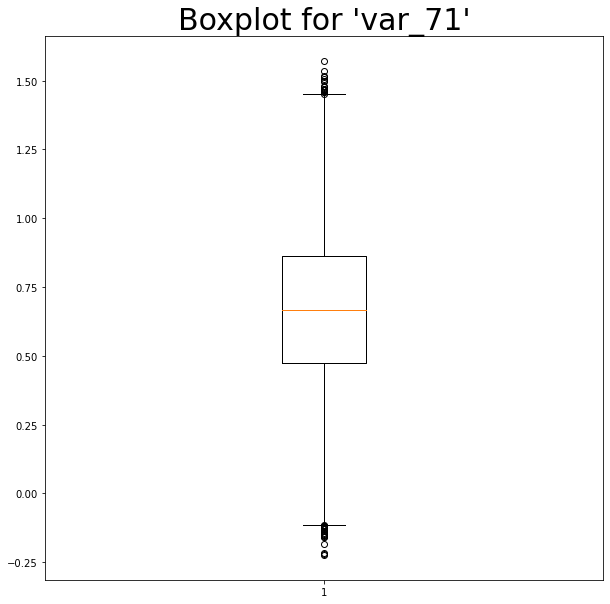

In [8]:
plt.figure(figsize=(10,10))
plt.boxplot(santanderdf["var_71"])
plt.title("Boxplot for 'var_71'", fontsize=30)

plt.show()

In [9]:
santanderdf.skew().sort_values()

#Las variables son bastantes simetricas

var_44    -0.340172
var_93    -0.238091
var_81    -0.232526
var_80    -0.220236
var_86    -0.216859
             ...   
var_0      0.235639
var_179    0.242891
var_2      0.260313
var_168    0.267414
target     2.657642
Length: 201, dtype: float64

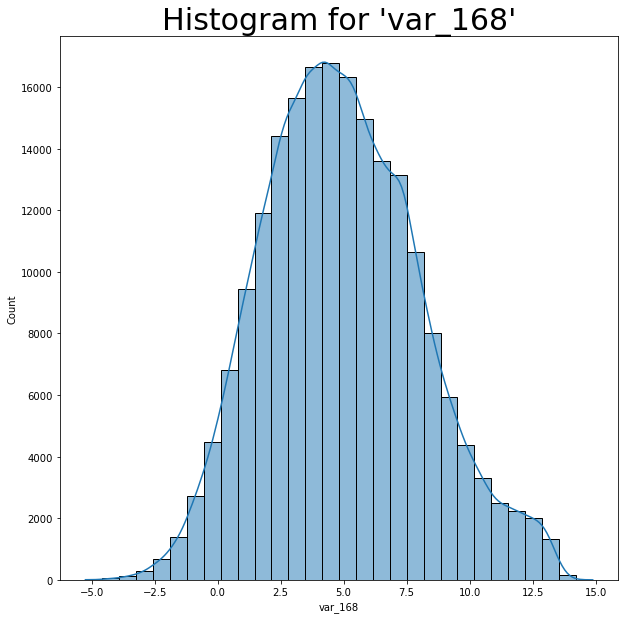

In [10]:
plt.figure(figsize=(10,10))
sns.histplot(santanderdf["var_168"], bins=30, kde=True)
plt.title("Histogram for 'var_168'", fontsize=30)

plt.show()

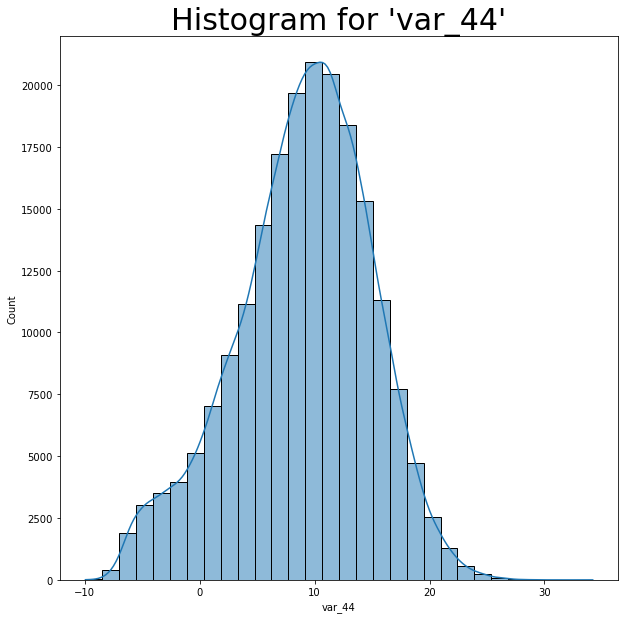

In [11]:
plt.figure(figsize=(10,10))
sns.histplot(santanderdf["var_44"], bins=30, kde=True)
plt.title("Histogram for 'var_44'", fontsize=30)

plt.show()

In [22]:
#analisis bivariado

In [23]:
correlation_table = df.corr()
correlation_table

,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
var_0,1.000000,-0.000544,0.006573,0.003801,0.001326,0.003046,0.006983,0.002429,0.004962,-0.002613,...,0.002752,0.000206,-0.005373,0.001616,-0.001514,0.002073,0.004386,-0.000753,-0.005776,0.003850
var_1,-0.000544,1.000000,0.003980,0.000010,0.000303,-0.000902,0.003258,0.001511,0.004098,-0.000832,...,0.006627,0.003621,-0.002604,0.001153,-0.002557,-0.000785,-0.000377,-0.004157,-0.004861,0.002287
var_2,0.006573,0.003980,1.000000,0.001001,0.000723,0.001569,0.000883,-0.000991,0.002648,-0.001932,...,0.000197,0.001285,-0.003400,0.000549,0.002104,-0.001070,0.003952,0.001078,-0.000877,0.003855
var_3,0.003801,0.000010,0.001001,1.000000,-0.000322,0.003253,-0.000774,0.002500,0.003553,-0.000826,...,0.000151,0.002445,-0.001530,-0.001699,-0.001054,0.001206,-0.002800,0.001164,-0.001651,0.000506
var_4,0.001326,0.000303,0.000723,-0.000322,1.000000,-0.001368,0.000049,0.004549,0.001194,-0.000918,...,0.001514,0.004357,0.003347,0.000813,-0.000068,0.003706,0.000513,-0.000046,-0.001821,-0.000786
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
var_195,0.002073,-0.000785,-0.001070,0.001206,0.003706,-0.001274,0.001244,0.001854,0.001396,-0.000868,...,0.004571,0.000870,-0.004745,-0.003143,-0.001201,1.000000,0.002517,-0.004170,-0.000536,0.002042
var_196,0.004386,-0.000377,0.003952,-0.002800,0.000513,0.002880,0.005378,0.001045,-0.003242,0.000052,...,-0.000847,0.002466,-0.001386,-0.005308,-0.005040,0.002517,1.000000,-0.000454,0.000253,0.000607
var_197,-0.000753,-0.004157,0.001078,0.001164,-0.000046,-0.000535,-0.003565,0.003466,-0.004583,0.003701,...,-0.004974,0.000906,-0.000527,0.005068,0.000884,-0.004170,-0.000454,1.000000,0.001183,0.004991
var_198,-0.005776,-0.004861,-0.000877,-0.001651,-0.001821,-0.000953,-0.003025,0.000650,0.002950,0.002343,...,-0.000153,-0.000067,0.003451,0.001646,0.003194,-0.000536,0.000253,0.001183,1.000000,-0.004731


In [24]:
correlation_table.describe()

,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
count,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,...,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000
mean,0.005030,0.005027,0.005118,0.004898,0.004950,0.005179,0.005122,0.005046,0.004949,0.004820,...,0.004993,0.005093,0.004878,0.005162,0.004833,0.004881,0.005151,0.004946,0.005045,0.004862
std,0.070766,0.070763,0.070768,0.070750,0.070747,0.070736,0.070765,0.070737,0.070750,0.070773,...,0.070771,0.070755,0.070770,0.070741,0.070759,0.070763,0.070747,0.070761,0.070763,0.070762
min,-0.007402,-0.008855,-0.008795,-0.007140,-0.007080,-0.005686,-0.008958,-0.005396,-0.005311,-0.007182,...,-0.007029,-0.007798,-0.007355,-0.005466,-0.006228,-0.007932,-0.006192,-0.007517,-0.007391,-0.005923
25%,-0.001755,-0.002044,-0.001825,-0.001538,-0.001449,-0.001281,-0.001947,-0.001370,-0.001471,-0.001904,...,-0.001949,-0.001624,-0.001713,-0.001666,-0.001565,-0.001667,-0.001565,-0.002077,-0.001636,-0.001857
50%,0.000263,0.000296,0.000473,-0.000148,-0.000013,0.000126,0.000371,0.000088,0.000060,-0.000085,...,0.000167,-0.000043,-0.000033,0.000253,-0.000252,0.000075,-0.000035,0.000084,-0.000173,-0.000050
75%,0.001924,0.001925,0.002260,0.001410,0.001418,0.001834,0.002331,0.001581,0.001643,0.001599,...,0.002184,0.001777,0.001824,0.001783,0.001355,0.001739,0.001940,0.001929,0.002008,0.001333
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


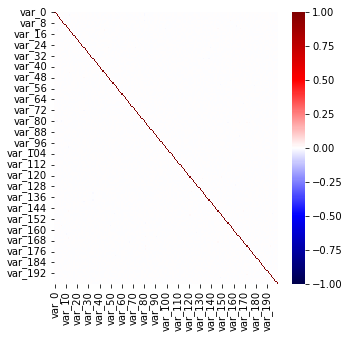

In [29]:
plt.figure(figsize=(5,5))
sns.heatmap(correlation_table, vmin = -1, vmax = 1, cmap = "seismic")
plt.show()

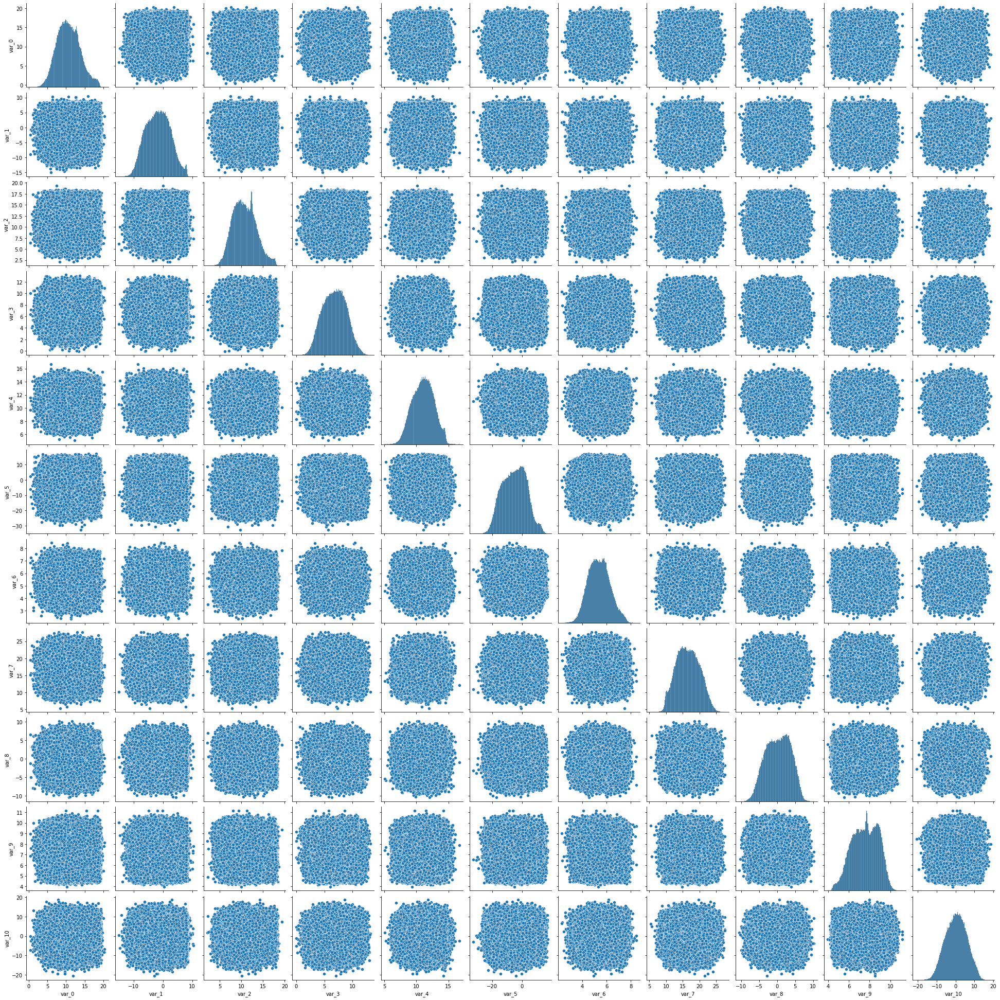

In [25]:
sns.pairplot(df.iloc[:,0:10])


plt.show()

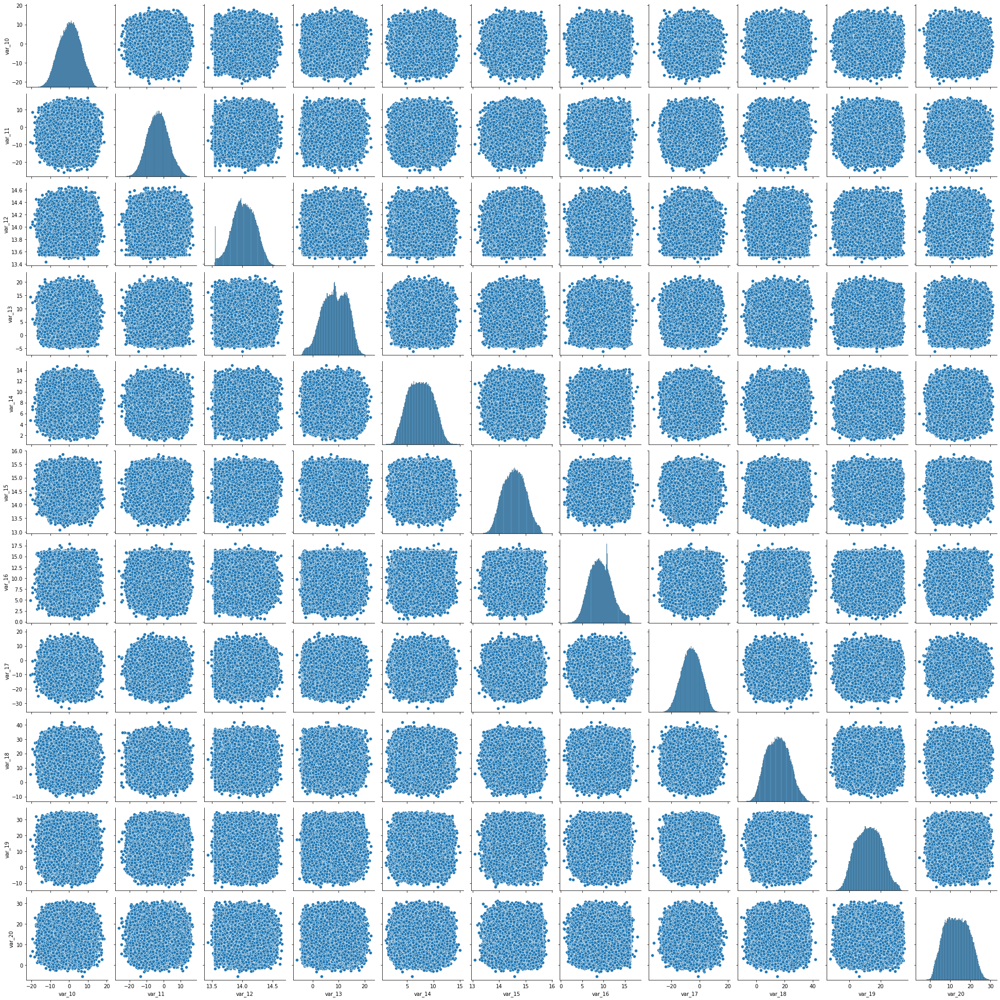

In [26]:
sns.pairplot(df.iloc[10:,0:20])


plt.show()

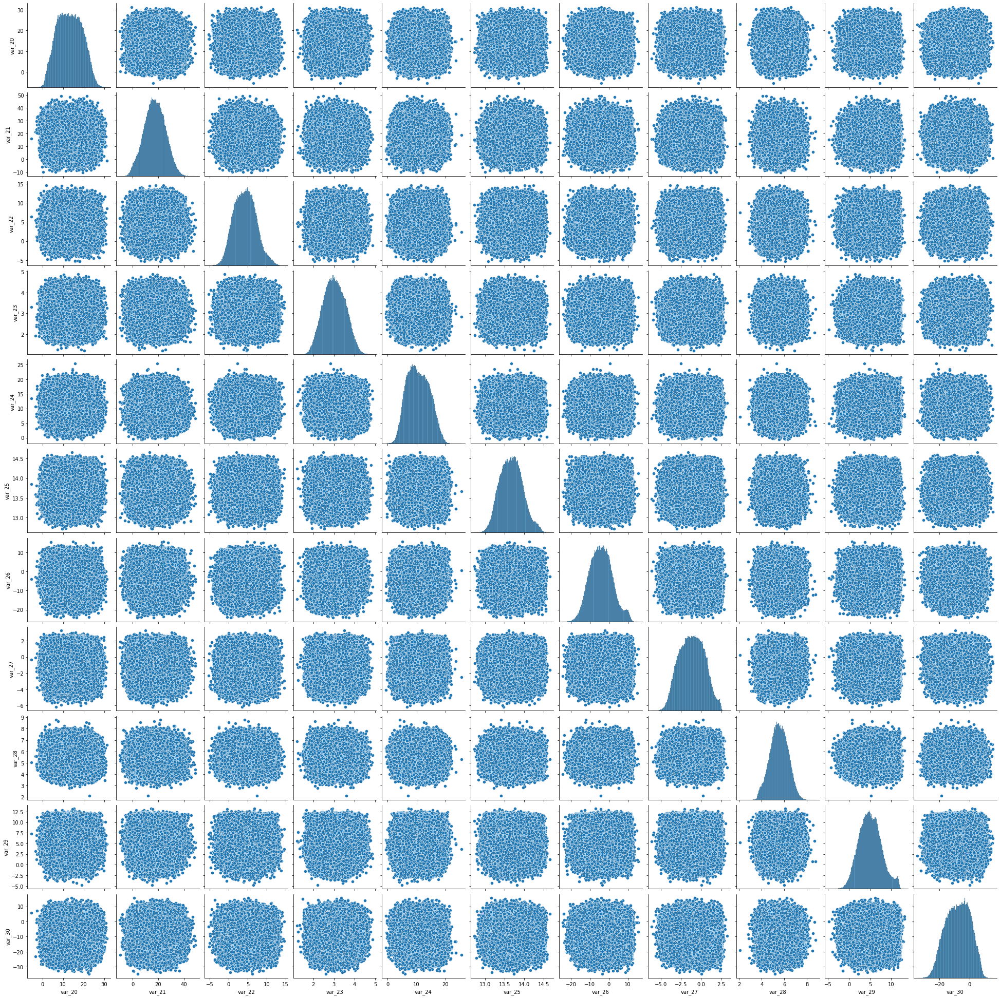

In [27]:
sns.pairplot(df.iloc[20:,0:30])


plt.show()

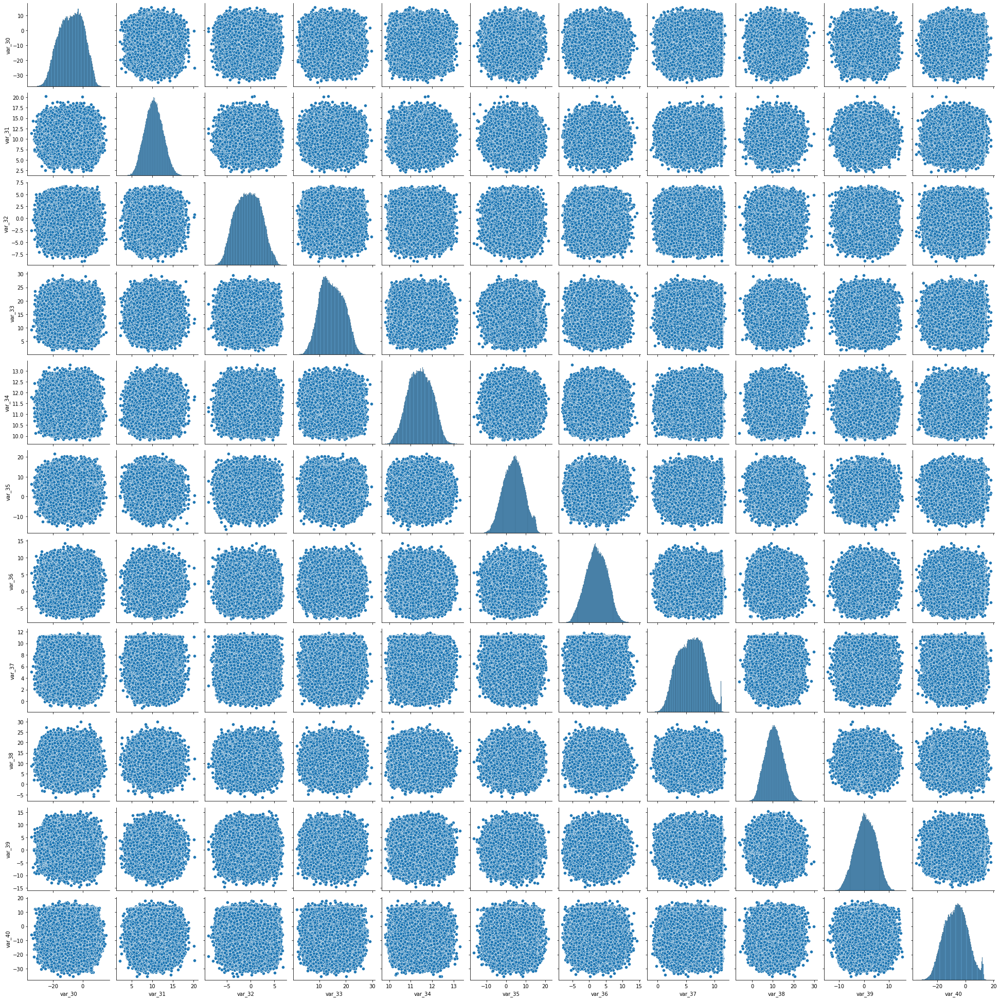

In [28]:
sns.pairplot(df.iloc[30:,0:40])


plt.show()

#La correlacion entre variables es casi nula

In [21]:
#analisis multivariado

In [16]:
def calculate_vif(df: pd.DataFrame, cols: List):
    """
    This function calculates the VIF
    for a set of columns, given a dataframe. 
    """
    
    X = df[cols]
    X['intercept'] = 1
    
    vif = pd.DataFrame()
    vif["variable"] = X.columns
    
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    
    vif = vif[vif["variable"]!='intercept']
    
    return vif

In [17]:

calculate_vif(df, df.columns).sort_values('VIF', ascending=False)

#Correlacion casi nula

,variable,VIF
139,var_139,1.002117
81,var_81,1.001990
12,var_12,1.001891
26,var_26,1.001793
166,var_166,1.001790
...,...,...
27,var_27,1.000831
17,var_17,1.000830
25,var_25,1.000829
7,var_7,1.000816


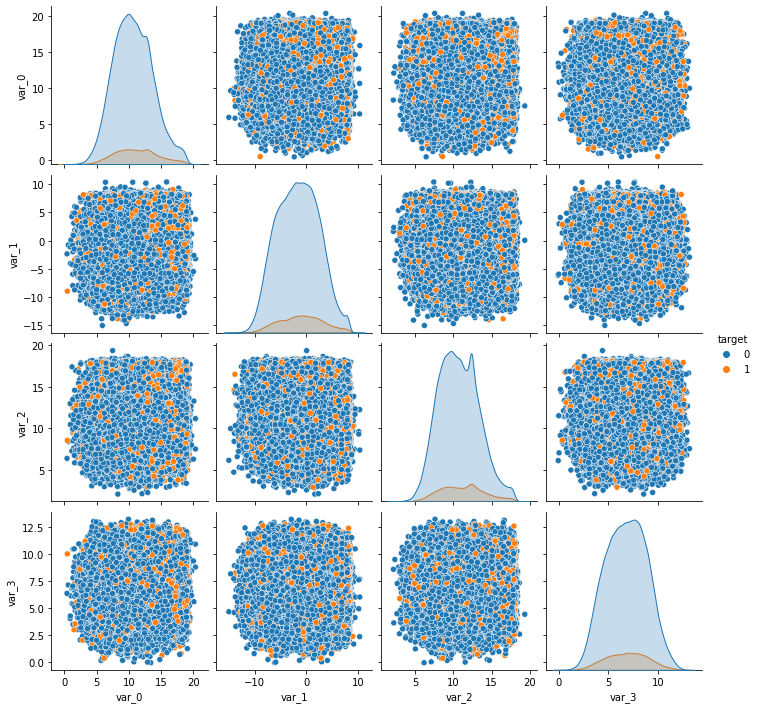

In [18]:
sns.pairplot(
    santanderdf,
    x_vars=["var_0","var_1","var_2","var_3"],
    y_vars=["var_0","var_1","var_2","var_3"],
    hue='target'
)

plt.show()

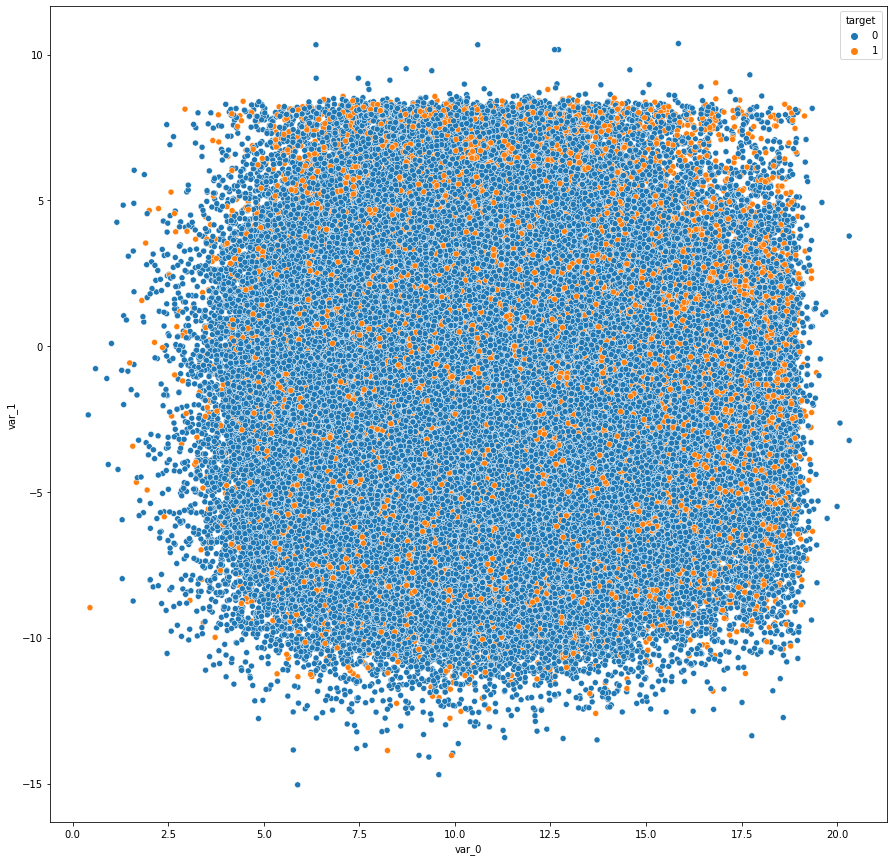

In [19]:
plt.figure(figsize=(15,15))

sns.scatterplot(data=santanderdf,
                x='var_0',
                y='var_1',
                hue='target')

plt.show()